In [21]:
%load_ext autoreload
%autoreload 2


from WaterClassification.common import *
from WaterClassification.Radiometry import RadiometryDB
from WaterClassification.Fitting import BaseFit
from WaterClassification.Classification.clustering import *

from functools import partial
from itertools import product

from pathlib import Path

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Clustering Algorithm Performances
In the previous notebook we saw that with the same input features (wavelenghts) and same normalization, the different clustering algorithms achieved similar results until K=6.<br>
In this notebook we will increase the clustering to 15 to check if this convergence continues beyond K > 6.<br>
Additionally, we will check if the final clustering from the algorithms looks similar.


 ## Load the Database

In [22]:
# Open the Radiometry Database
db = RadiometryDB(r'D:\OneDrive - Agência Nacional de Águas\Data\GET-RadiometryDB')

db.load_radiometries(r_types=['Rrs', 'Rrs_OSOAA'], 
                     norm=True,                                                        # create the normalized bands and also the area
                     funcs=partial(calc_area, col_name='flatness', norm_band='700'),   # create the flatness band
                     qry="SPM > 0 and Status != 'Deleted' and Status != 'Suspicious'"  # clear deleted and no data
                    )
rrs = db.rdmtries['Rrs']

rrs.head(3)

Radiometries ['Rrs', 'Rrs_OSOAA'] loaded in dictionary .rdmtries


,Area_2,Station_2,Measurement,Start_Date_2,SPM_2,Status_2,Description_2,319,320,321,...,n943,n944,n945,n946,n947,n948,n949,n950,n951,flatness
Id,,,,,,,,,,,,,,,,,,,,,
0,Descoberto,Ponto_1,20160318-1139,2016-03-18 11:39:00,7.0,Ok,GIANCARLO_ CAMP1_1,NaN,0.003272,0.003054,...,0.000138,0.000127,0.000149,0.000184,0.000180,0.000186,0.000191,0.000213,NaN,-1.480905
1,Descoberto,Ponto_2,20160318-1214,2016-03-18 12:14:00,8.4,Ok,GIANCARLO_ CAMP1_2,NaN,0.002663,0.002460,...,0.000193,0.000212,0.000206,0.000210,0.000192,0.000204,0.000186,0.000189,NaN,-1.484569
2,Descoberto,Ponto_3,20160318-1228,2016-03-18 12:28:00,5.8,Ok,GIANCARLO_ CAMP1_3,NaN,0.003356,0.003116,...,0.000143,0.000146,0.000142,0.000146,0.000158,0.000165,0.000162,0.000154,NaN,-1.755808


In [6]:
# deleting outliers
rrs.drop(index=[410, 418, 390, 520, 409, 658], inplace=True, errors='ignore')
len(rrs)

869

## Compute the Multi Clustering until K=15 for the 3 algorithms
We will used fixed parameters for:
* Sampling 1nm (from 400 to 920)
* Reflectance types: raw + norm
* Post normalization: Standard
* Fitting bands: s2bands and ratio
<br>


In [7]:
def parse_combination(combination):
    sampling, ref_type, normalization, algo = combination
    
    # first, get the input wavelenghts
    if isinstance(sampling, int):
        wls = wavelength_range(400, 920, step=sampling)
        wls_name = f'{sampling}nm'
    else:
        wls = sampling[0]
        wls_name = sampling[1]
        
    # create the bands, according to the reflectance types
    bands = []
    ref_type_name = '' 
    for tp in listify(ref_type):
        ref_type_name = ref_type_name + tp
        if tp == 'raw':
            bands = bands + wls
        elif tp == 'norm':
            bands = bands + [f'n{b}' for b in wls]
        else:
            bands = bands + listify(tp)
            
    name = '_'.join([algo, wls_name, ref_type_name, str(normalization)])
    
    return bands, name, normalization, algo


def full_process_clustering(df, range_clusters, samplings, ref_types, normalizations, algos, fit_bands, funcs, calc=False, save=False, load=True):
    combinations = list(product(samplings, ref_types, normalizations, algos))
    
    print(f'Total of {len(combinations)} were created.')    
    
    results = {}
    for combination in combinations:
        cluster_bands, name, normalization, algo = parse_combination(combination)
        
        print(f'**** {name} ****')
        
        if calc:
            mcluster = MultiClustering(df,
                                       cluster_features=cluster_bands,
                                       range_clusters=range_clusters,
                                       algo=algo,
                                       norm=normalization)

            mcluster.fit(fit_features=fit_bands, 
                         funcs=funcs, 
                         n_cpus=6, 
                         pool=None,
                         optimize_metric=True)
        
            if save:
                # save the pandas summary
                result_df = mcluster.summary()
                result_df.to_csv(f'../data/{name}.csv')

                # save the figure
                fig = mcluster.plot_clustering('area', log_y=True)
                pio.write_image(fig, f'../data/{name}.png', width=1200, height=800)
            

            results[name] = mcluster
        
        elif load:
            results[name] = load_obj(f'../data/{name}.multicluster')

    return results


In [8]:
samplings = [1]
ref_types = [['raw', 'norm']]
normalizations = ['Standard']
algos = ['k-means', 'agglomerative', 'FCM']
fit_bands = s2bands + s2bands_norm + ['area', 'b865/b665']
clusters_range = (1, 16)
funcs = BaseFit.available_funcs

mclusters = full_process_clustering(rrs, clusters_range, samplings, ref_types, normalizations, algos, fit_bands, funcs, calc=False, save=False, load=True)

Total of 3 were created.
**** k-means_1nm_rawnorm_Standard ****
**** agglomerative_1nm_rawnorm_Standard ****
**** FCM_1nm_rawnorm_Standard ****


## Compare the overall results for the 3 clusterings
From the graph below, we can see that the results are pretty similar until K=15

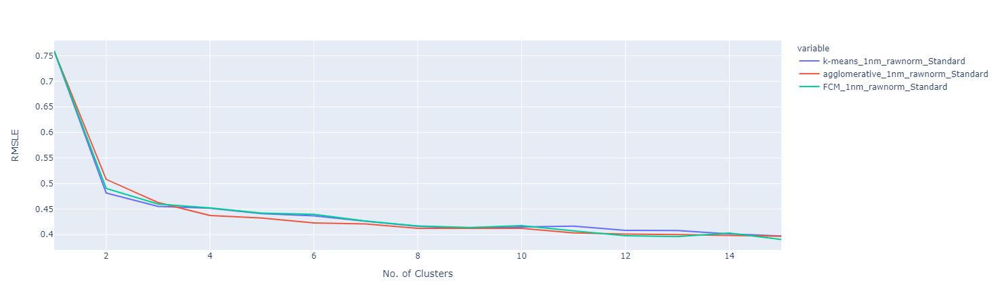

In [9]:
MultiClustering.plot_metric_by_cluster(mclusters.values(), mclusters.keys())

In [10]:
# for name, mcluster in mclusters.items():
#     mcluster.save_memory(max_n=1)
#     save_obj(mcluster, f'../data/{name}.multicluster')

## Analysing the differences with 4 clusters

### K-MEANS

In [11]:
kmeans = mclusters['k-means_1nm_rawnorm_Standard']
kmeans.sort_by_variable()
kmeans[8].group_fit.summary()

,func,band,R^2,MSE,RMSE,RMSLE,SSE,params,qty
0,Power,n490,0.0662,5.2578,2.2930,0.4640,3.312414e+02,"[-4580.514213427159, 1.089070269100373, 9.7778...",63
1,Exponential,705,0.4110,14.3716,3.7910,0.6409,1.379672e+03,"[259.53456250246757, -259.0886768704025]",96
2,Exponential,783,0.4768,14.3696,3.7907,0.4141,1.379482e+03,"[816.7789026617803, -815.1188394711671]",96
3,Power,705,0.4793,10.7821,3.2836,0.4371,9.703909e+02,"[346.34043998224024, 0.7409341298802272, -0.27...",90
4,Exponential,n783,0.3236,313.5113,17.7063,0.3670,5.298341e+04,"[19843.71061442201, -19863.292200052023]",169
5,Power,b865/b665,0.6127,2643.3757,51.4138,0.4162,4.388004e+05,"[934.0444032210603, 1.92938173513914, 11.85760...",166
6,Power,940,0.7238,5995.5030,77.4306,0.2226,2.278291e+05,"[3919.0250592462744, 0.2065770046070605, -1365...",38
7,Power,b865/b665,0.7695,27762.8235,166.6218,0.2631,4.192186e+06,"[1903.7327130744147, 3.6745706294911162, 100.7...",151
overall,NaN,NaN,0.9246,5656.9160,75.2125,0.4162,4.915860e+06,None,869


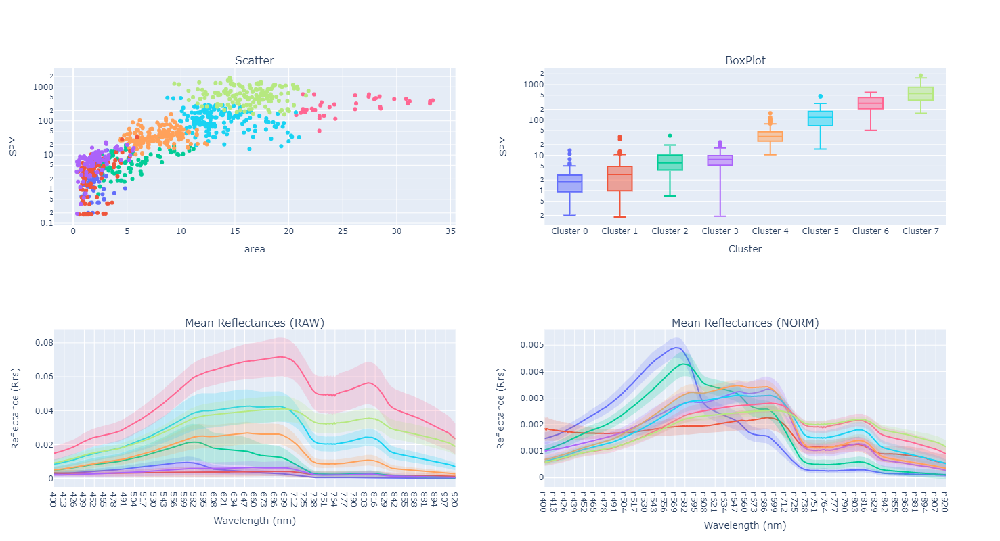

In [12]:
kmeans[8].plot_summary()

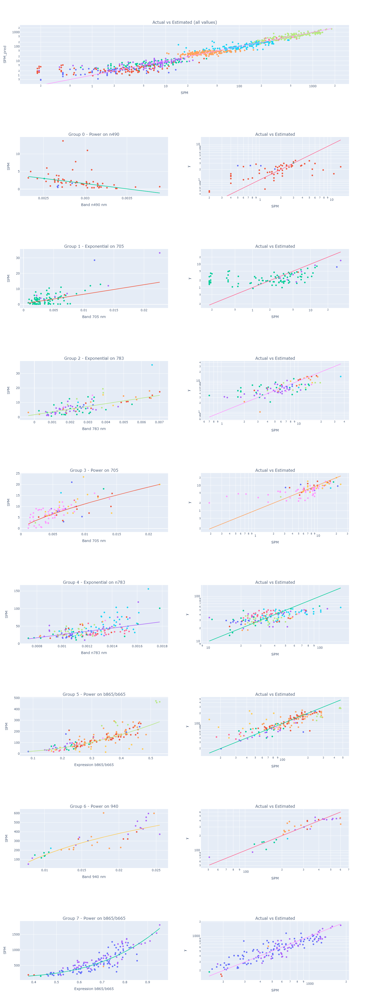

In [14]:
kmeans[8].group_fit.plot_groups_summary(color='Area')

### FCM

In [15]:
fcm = mclusters['FCM_1nm_rawnorm_Standard']
fcm.sort_by_variable()
fcm[8].group_fit.summary()

,func,band,R^2,MSE,RMSE,RMSLE,SSE,params,qty
0,Linear,n490,0.0669,5.2537,2.2921,0.4645,3.309841e+02,"[-3022.3063079161943, 10.658260711789822]",63
1,Exponential,705,0.3458,14.9590,3.8677,0.6468,1.391184e+03,"[237.51550497717426, -236.94822400248677]",93
2,Linear,783,0.4821,16.3948,4.0491,0.4114,1.639484e+03,"[2168.62237568141, 1.0887864912996872]",100
3,Power,705,0.5088,10.1519,3.1862,0.4265,9.441280e+02,"[356.0619025704001, 0.7469854088303522, -0.244...",93
4,Linear,n783,0.3132,335.6019,18.3194,0.3660,5.000469e+04,"[46540.30176831804, -20.25242353892834]",149
5,Linear,n783,0.4611,1062.3807,32.5942,0.3694,1.157995e+05,"[86090.12075286906, -50.8290720304238]",109
6,Power,b865/b665,0.8435,6451.8502,80.3234,0.3758,8.322887e+05,"[2334.728767700475, 3.697880768045442, 85.0778...",129
7,Power,b865/b665,0.6594,40367.4064,200.9164,0.2955,5.368865e+06,"[1776.3343389536244, 4.518071609227643, 200.20...",133
overall,NaN,NaN,0.9023,7331.7189,85.6255,0.4169,6.371264e+06,None,869


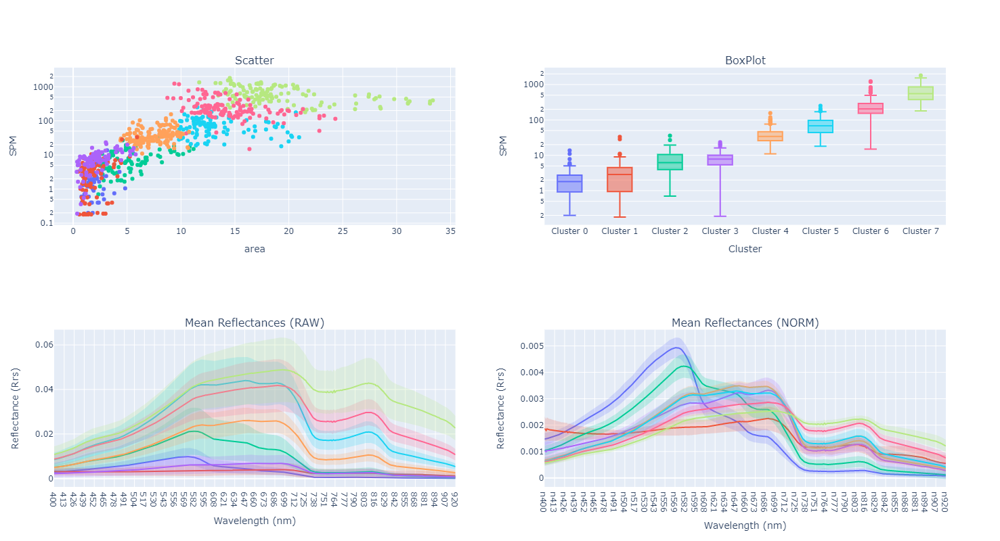

In [16]:
fcm[8].plot_summary()

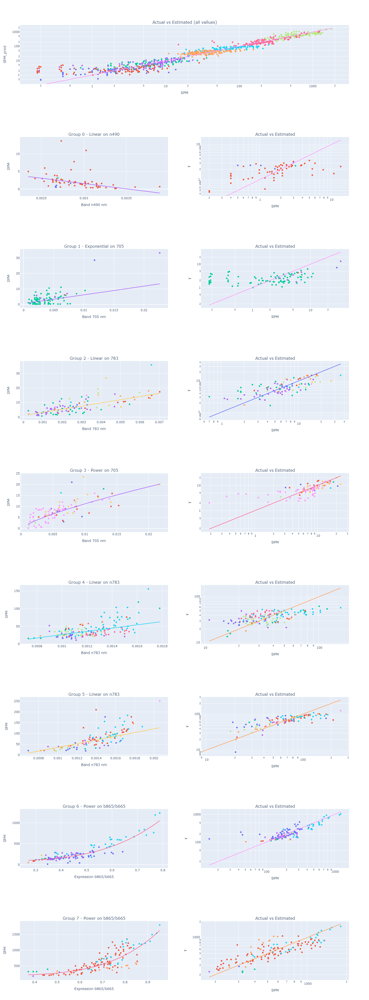

In [19]:
fcm[8].group_fit.plot_groups_summary(color='Area')

### Agglomerative

In [17]:
agg = mclusters['agglomerative_1nm_rawnorm_Standard']
agg.sort_by_variable()
agg[8].group_fit.summary()

,func,band,R^2,MSE,RMSE,RMSLE,SSE,params,qty
0,Power,740,0.1492,5.0094,2.2382,0.4505,2.955561e+02,"[1745.501189602644, 0.9060889511670663, 0.0183...",59
1,Exponential,705,0.4135,15.1147,3.8878,0.6408,1.435897e+03,"[241.95762075928195, -241.40884613858617]",95
2,Exponential,783,0.6501,12.2289,3.4970,0.4205,1.198434e+03,"[810.4348914835018, -808.8798717786334]",98
3,Nechad,705,0.4356,21.0969,4.5931,0.4437,2.172983e+03,"[326.425924173761, -1.9175031563985518, 1.1405...",103
4,Power,783,0.4619,354.1166,18.8180,0.3607,5.311749e+04,"[49343674.22002877, 3.2798355824208905, 24.246...",150
5,Exponential,n842,0.6100,2204.1477,46.9484,0.4039,3.284180e+05,"[74074.05355049978, -74148.69467494138]",149
6,Power,n842,0.8608,3210.0062,56.6569,0.2542,2.214904e+05,"[651624830.389318, 2.269618810293089, -3.89779...",69
7,Nechad,b865/b665,0.7429,29468.6931,171.6645,0.2717,4.302429e+06,"[163.45885899167084, 4.032576669186442, -169.8...",146
overall,NaN,NaN,0.9247,5650.8147,75.1719,0.4122,4.910558e+06,None,869


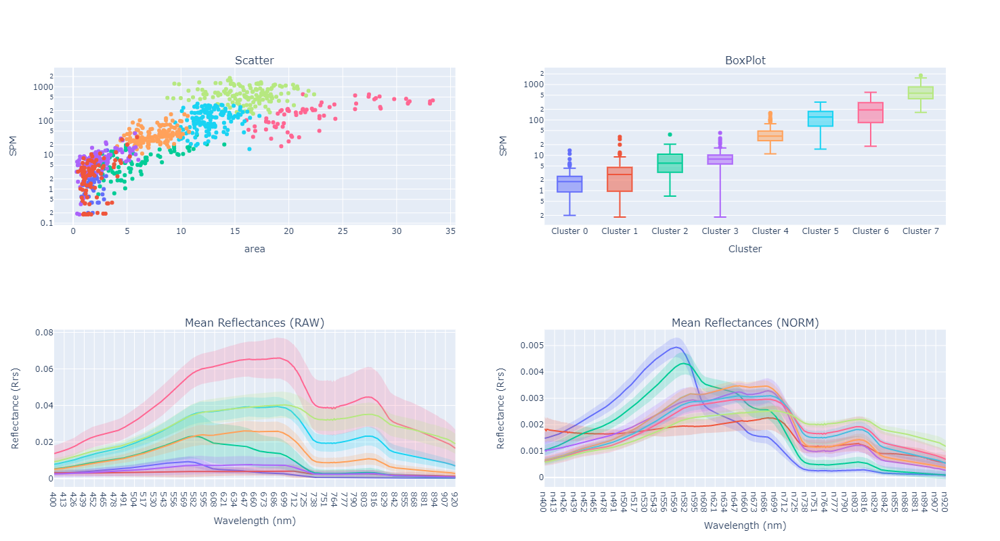

In [18]:
agg[8].plot_summary()

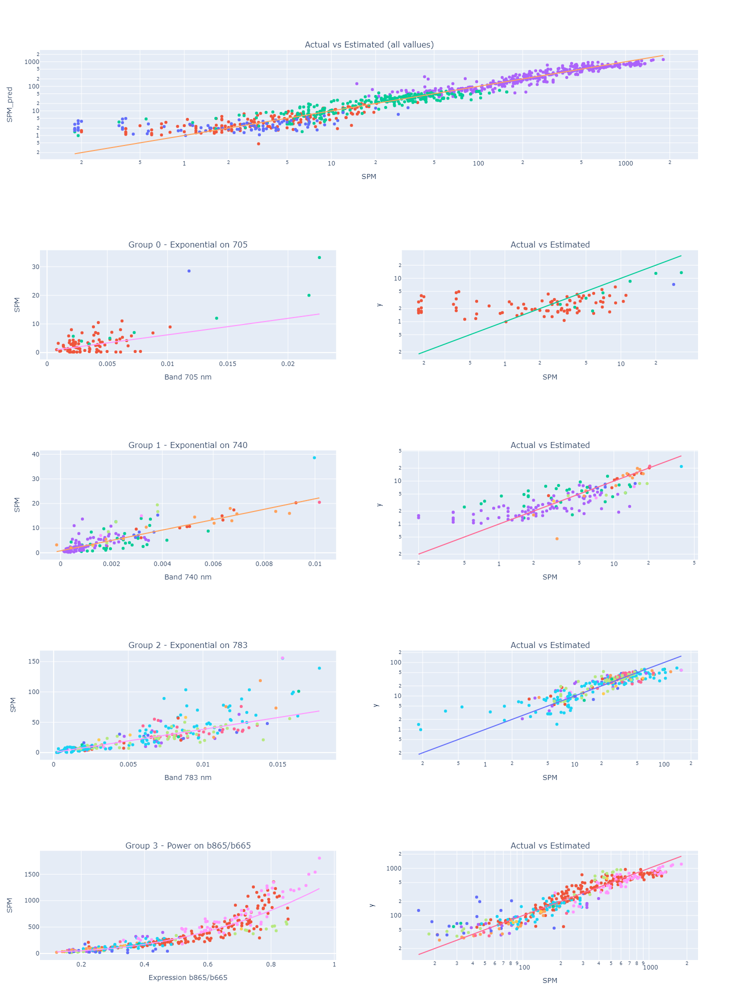

In [21]:
agg[4].group_fit.plot_groups_summary(color='Area')